# Business case: Understanding profitability in the US financial market

## Eduardo Rodríguez Gil - A01274913

This is business case prepared for the Statistics Module (Bloque 1) of the Advanced AI concentration

## 1 Case Description

You were hired as a data scientist in an important mutual fund firm in the department of financial analysis. The firm has been doing financial analysis and financial forecast for several years. You were hired to come up with alternative approaches to do descriptive analytics in order to find better future alternatives for forecasting methods.

You have to analyze historical quarterly financial statements of all US public firms listed in the New York Exchange and NASDAQ. You will receive this dataset in a .csv format.

You have to carefully read the data dictionary to understand each variable and the dataset to understand its structure.

## 2 Business Questions

All your data and statistical analysis has to be tailored to respond the following questions:

In [179]:
# Importamos las librerias que vamos a utilizar.
import numpy as np
import pandas as pd
import pandas_datareader as pdr
import seaborn as sb
import matplotlib.pyplot as plt
import plotly.express as px
import statsmodels.api as sm
from scipy.stats.mstats import winsorize

In [180]:
# Importamos los datos del dataframe del .csv
from google.colab import drive

drive.mount("/content/gdrive")  
!pwd

%cd "/content/gdrive/MyDrive/Inteligencia Artificial"
!ls

df_us2022 = pd.read_csv('us2022q2a.csv') # US 2022 data frame
df_firms = pd.read_csv('usfirms2022.csv') # US firms 2022 data frame

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/Inteligencia Artificial
/content/gdrive/MyDrive/Inteligencia Artificial
car.data   iris.data   tested.csv     usfirms2022.csv  wine.names
car.names  iris.names  us2022q2a.csv  wine.data


In [181]:
df_us2022

,firm,q,revenue,cogs,sgae,otheropexp,extraincome,finexp,incometax,totalassets,totalliabilities,shortdebt,longdebt,stockholderequity,adjprice,originalprice,sharesoutstanding,fiscalmonth,year,cto
0,A,2000q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.761670,104.0000,452000.000,NaN,2000.0,1.0
1,A,2000q2,2485000.0,1261000.0,1.010000e+06,0.0,42000.000000,0.000,90000.0,7321000.000,2679000.000,512000.000,0.000,4642000.000,45.215607,73.7500,452271.967,6.0,2000.0,2.0
2,A,2000q3,2670000.0,1369000.0,1.091000e+06,0.0,28000.000000,0.000,83000.0,7827000.000,2925000.000,528000.000,0.000,4902000.000,30.003238,48.9375,453014.579,9.0,2000.0,3.0
3,A,2000q4,3372000.0,1732000.0,1.182000e+06,0.0,10000.000000,0.000,163000.0,8425000.000,3160000.000,830000.000,0.000,5265000.000,33.566841,54.7500,456366.381,12.0,2000.0,4.0
4,A,2001q1,2841000.0,1449000.0,1.113000e+06,0.0,-6000.000000,0.000,119000.0,9208000.000,3667000.000,556000.000,0.000,5541000.000,18.840347,30.7300,456769.737,3.0,2001.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
324442,ZYNE,2021q3,0.0,0.0,1.021065e+04,0.0,-376.636750,-5.038,0.0,89996.170,11309.171,207.635,411.237,78686.999,4.240000,4.2400,41251.537,9.0,2021.0,3.0
324443,ZYNE,2021q4,0.0,0.0,8.836436e+03,0.0,16.937906,-4.433,0.0,81171.507,10258.173,209.068,353.694,70913.334,2.880000,2.8800,41217.537,12.0,2021.0,4.0
324444,ZYNE,2022q1,0.0,0.0,8.903915e+03,0.0,317.252110,-96.044,0.0,74381.029,9214.059,210.512,295.754,65166.970,2.050000,2.0500,42447.037,3.0,2022.0,1.0
324445,ZYNE,2022q2,0.0,0.0,9.168770e+03,0.0,-775.927860,-91.691,0.0,67006.959,9765.086,211.965,237.414,57241.873,1.140000,1.1400,43595.959,6.0,2022.0,2.0


In [182]:
df_firms

,Ticker,Name,N,Class,Country\nof Origin,Type of Asset,Sector NAICS\nlevel 1,Exchange / Src,Sector\nEconomatica,Sector NAICS\nlast available,partind
0,FLWS,1 800 Flowers Com Inc,1,Com A,US,Stock,Retail Trade,NASDAQ,Trade,Retail Trade,-
1,TXG,"10x Genomics, Inc",2,Com A,US,Stock,Manufacturing,NASDAQ,Electric Electron,"Navigational, Measuring, Electromedical, and C...",-
2,GOED,1847 Goedeker Inc,3,Com,US,Stock,Retail Trade,AMEX,Trade,Furniture and Home Furnishings Stores,-
3,ONEM,"1life Healthcare, Inc",4,Com,US,Stock,Health Care and Social Assistance,NASDAQ,Other,Offices of Physicians,-
4,SRCE,1st Source Corp,5,Com,US,Stock,Finance and Insurance,NASDAQ,Finance and Insurance,Depository Credit Intermediation,-
...,...,...,...,...,...,...,...,...,...,...,...
3603,ZUO,"Zuora, Inc",3604,Com A,US,Stock,Information,NYSE,Software & Data,Software Publishers,-
3604,ZWS,Zurn Elkay Water Solutions Corp,3605,Com,US,Stock,Manufacturing,NYSE,Industrial Machin,Other General Purpose Machinery Manufacturing,-
3605,ZY,Zymergen Inc,3606,Com,US,Stock,"Professional, Scientific, and Technical Services",NASDAQ,Other,Scientific Research and Development Services,-
3606,ZYNE,"Zynerba Pharmaceuticals, Inc",3607,Com,US,Stock,Manufacturing,NASDAQ,Chemical,Pharmaceutical and Medicine Manufacturing,-


In [183]:
# Unimos la dos tablas para convertirlo en un solo dataframe
us2022_merged = df_us2022.merge(df_firms, left_on='firm', right_on='Ticker')

In [184]:
us2022_merged

,firm,q,revenue,cogs,sgae,otheropexp,extraincome,finexp,incometax,totalassets,...,Name,N,Class,Country\nof Origin,Type of Asset,Sector NAICS\nlevel 1,Exchange / Src,Sector\nEconomatica,Sector NAICS\nlast available,partind
0,A,2000q1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"Agilent Technologies, Inc",94,Com,US,Stock,Manufacturing,NYSE,Electric Electron,"Navigational, Measuring, Electromedical, and C...",0.124
1,A,2000q2,2485000.0,1261000.0,1.010000e+06,0.0,42000.000000,0.000,90000.0,7321000.000,...,"Agilent Technologies, Inc",94,Com,US,Stock,Manufacturing,NYSE,Electric Electron,"Navigational, Measuring, Electromedical, and C...",0.124
2,A,2000q3,2670000.0,1369000.0,1.091000e+06,0.0,28000.000000,0.000,83000.0,7827000.000,...,"Agilent Technologies, Inc",94,Com,US,Stock,Manufacturing,NYSE,Electric Electron,"Navigational, Measuring, Electromedical, and C...",0.124
3,A,2000q4,3372000.0,1732000.0,1.182000e+06,0.0,10000.000000,0.000,163000.0,8425000.000,...,"Agilent Technologies, Inc",94,Com,US,Stock,Manufacturing,NYSE,Electric Electron,"Navigational, Measuring, Electromedical, and C...",0.124
4,A,2001q1,2841000.0,1449000.0,1.113000e+06,0.0,-6000.000000,0.000,119000.0,9208000.000,...,"Agilent Technologies, Inc",94,Com,US,Stock,Manufacturing,NYSE,Electric Electron,"Navigational, Measuring, Electromedical, and C...",0.124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
323811,ZYNE,2021q2,0.0,0.0,9.838494e+03,0.0,-117.528220,-5.943,0.0,98195.904,...,"Zynerba Pharmaceuticals, Inc",3607,Com,US,Stock,Manufacturing,NASDAQ,Chemical,Pharmaceutical and Medicine Manufacturing,-
323812,ZYNE,2021q3,0.0,0.0,1.021065e+04,0.0,-376.636750,-5.038,0.0,89996.170,...,"Zynerba Pharmaceuticals, Inc",3607,Com,US,Stock,Manufacturing,NASDAQ,Chemical,Pharmaceutical and Medicine Manufacturing,-
323813,ZYNE,2021q4,0.0,0.0,8.836436e+03,0.0,16.937906,-4.433,0.0,81171.507,...,"Zynerba Pharmaceuticals, Inc",3607,Com,US,Stock,Manufacturing,NASDAQ,Chemical,Pharmaceutical and Medicine Manufacturing,-
323814,ZYNE,2022q1,0.0,0.0,8.903915e+03,0.0,317.252110,-96.044,0.0,74381.029,...,"Zynerba Pharmaceuticals, Inc",3607,Com,US,Stock,Manufacturing,NASDAQ,Chemical,Pharmaceutical and Medicine Manufacturing,-


## 2.1 General questions:

By industry, what is the composition of US public firms in terms of firm size, sales performance and profitability?

Why some firms are more profitable than others? Which factors/variables from financial statements are related to stock returns?

## 2.2.1 About descriptive statistics:

### 2.2.1.1 Considering the most recent financial quarter of the dataset:

In [185]:
# Obtenemos el financial quarter del dataset
us2022_quarter = us2022_merged['q'] == '2022q2'

* Show how many firms by industry there are in the sample

In [186]:
# Aqui se muestra el número de industrias que hay en el actualmente en el dataframe
df_e = df_firms['Sector NAICS\nlevel 1'].value_counts()

In [187]:
# Obtenemos los Firm Size measures de Book value
us2022_merged['Book value'] = us2022_merged['totalassets'] - us2022_merged['totalliabilities']


# Obtenemos los Firm Size measures de Market value
us2022_merged['Market value'] = us2022_merged['originalprice'] * us2022_merged['sharesoutstanding']


#  Obtenemos el Profit Margin measures con Operating profit
us2022_merged['Operating profit'] = us2022_merged['revenue'] - us2022_merged['cogs'] - us2022_merged['sgae'] - us2022_merged['otheropexp']


# Obtenemos el Profit Margin measures con Operating profit margin
us2022_merged['Operating profit margin'] = us2022_merged['Operating profit'] / us2022_merged['revenue']


# Obtenemos el Net Income
us2022_merged['Net Income'] = us2022_merged['Operating profit'] - us2022_merged['incometax'] - us2022_merged['finexp']


# Obtenemos el Profit margin
us2022_merged['Profit margin'] = us2022_merged['Net Income'] / us2022_merged['revenue']

* For each industry (and for all industries), what can you say about the typical firm size in terms of market value and book value? How much these variables change within each industry? How firm size (in market value) is distributed?

In [188]:
# Graficamos las empresas existentes y podemos ver que algunas empresas son de la parte de finanzas
px.bar(df_e,title="Cantidad de empresas")

In [189]:
# Sacamos la mediana de Market value y de Book value y la imprimimos
analisis = us2022_merged[["Sector NAICS\nlevel 1", "Market value", "Book value"]]
print("Market value median = ", analisis["Market value"].median()) # Imprimimos Market value median
print("Book value median = ", analisis["Book value"].median()) # Imprimimons Book value median

Market value median =  1570573.4614000001
Book value median =  567545.0


In [190]:
# Mostramos la media de Market value y Book value de todas las columnas
median = analisis.groupby("Sector NAICS\nlevel 1").median()
median.columns = median.columns.str.replace('Market value', 'Mediana de Market value')
median.columns = median.columns.str.replace('Book value', 'Mediana de Book value')
median

,Mediana de Market value,Mediana de Book value
Sector NAICS level 1,,
-,5.463857e+06,5.546512e+06
Accommodation and Food Services,2.061916e+06,3.688350e+05
Administrative and Support and Waste Management and Remediation Services,1.787995e+06,4.172800e+05
"Agriculture, Forestry, Fishing and Hunting",1.769082e+06,1.038334e+06
"Arts, Entertainment, and Recreation",2.932455e+06,3.238500e+05
Construction,1.540277e+06,8.473800e+05
Educational Services,1.277089e+06,4.685120e+05
Finance and Insurance,1.623428e+06,9.364780e+05
Health Care and Social Assistance,1.637667e+06,4.531870e+05


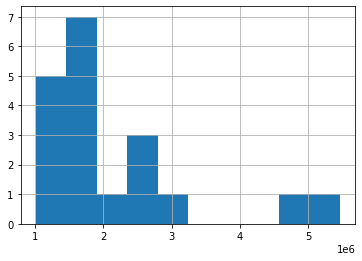

In [191]:
# Graficamos la Mediana de Market value para poder tener una mejor perspectiva en cuanto a la median de las empresas
median['Mediana de Market value'].hist()

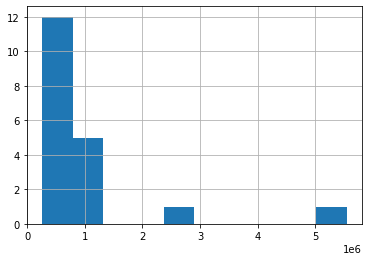

In [192]:
# Graficamos la Mediana de Book value para poder tener una mejor perspectiva en cuanto a la median de las empresas
median['Mediana de Book value'].hist()

Para poder realizar esto ocupamos las formulas que nos proporciono para poder hacer las Variable calculations.

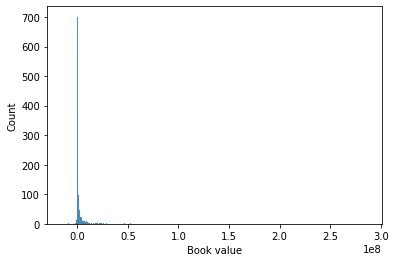

In [193]:
# Mostramos un histograma para ver la frecuencia del Book value 
sb.histplot(us2022_merged[us2022_quarter]['Book value'])

In [194]:
# Imprimimos valores descriptivos para tener una mejor perspectiva de los datos del histograma de Book value
print(us2022_merged[us2022_quarter]['Book value'].describe())

count    3.362000e+03
mean     3.331749e+06
std      1.386098e+07
min     -1.479100e+07
25%      1.060878e+05
50%      4.577370e+05
75%      1.792766e+06
max      2.861430e+08
Name: Book value, dtype: float64


In [195]:
# Mostramos el gráfico para revisar los datos de Book value de cada industria y podemos darnos cuenta que los datos del Book value estan por encima de lo que se observa en el histograma
px.bar(us2022_merged[us2022_quarter], x = 'Sector\nEconomatica', y = 'Book value', title = "Book values por industria")

In [196]:
# Mostramos un histograma para ver la frecuencia del Market value 
px.histogram(us2022_merged[us2022_quarter]['Market value'])

In [197]:
# Imprimimos valores descriptivos para tener una mejor perspectiva de los datos del histograma de Market value
print(us2022_merged[us2022_quarter]['Market value'].describe())

count    3.548000e+03
mean     1.095980e+07
std      6.632062e+07
min      3.490000e+01
25%      1.907523e+05
50%      1.105076e+06
75%      4.607257e+06
max      2.212838e+09
Name: Market value, dtype: float64


In [198]:
# Mostramos el gráfico para revisar los datos de Market value de cada industria y podemos darnos cuenta que los datos del Market value son más dispersos que los del Book value
px.bar(us2022_merged[us2022_quarter], x = 'Sector\nEconomatica', y = 'Market value', title = "Market values por industria")

* For each industry (and for all industries), what can you say about profit margin of firms? show a) descriptive statistics of profit margin and b) plot(s) to illustrate how profit margin changes across industries.

In [199]:
px.box(us2022_merged[us2022_quarter], x = 'Sector NAICS\nlevel 1', y= 'Profit margin', title = "Profit margin por industria")

* Which are the biggest 10 US firms in terms of market value and how far they are from the typical size of a US firm?

In [200]:
# Obtenemos las 10 mayores firms de US en terminos del Market value 
us10_firms_markValue = us2022_merged.sort_values("Market value", ascending = False).head(10)

In [201]:
us10_firms_markValue

,firm,q,revenue,cogs,sgae,otheropexp,extraincome,finexp,incometax,totalassets,...,Exchange / Src,Sector\nEconomatica,Sector NAICS\nlast available,partind,Book value,Market value,Operating profit,Operating profit margin,Net Income,Profit margin
807,AAPL,2021q4,123945000.0,69702000.0,12755000.0,0.0,-247000.0,0.0,6611000.0,381191000.0,...,NASDAQ,Electric Electron,Computer and Peripheral Equipment Manufacturing,6.056,71932000.0,2.913284e+09,41488000.0,0.334729,34877000.0,0.281391
808,AAPL,2022q1,97278000.0,54719000.0,12580000.0,0.0,160000.0,0.0,5129000.0,350662000.0,...,NASDAQ,Electric Electron,Computer and Peripheral Equipment Manufacturing,6.056,67399000.0,2.849538e+09,29979000.0,0.308179,24850000.0,0.255453
191173,MSFT,2021q4,51728000.0,16960000.0,12521000.0,0.0,268000.0,0.0,3750000.0,340389000.0,...,NASDAQ,Software & Data,Software Publishers,6.026,160010000.0,2.525084e+09,22247000.0,0.430077,18497000.0,0.357582
806,AAPL,2021q3,83360000.0,48186000.0,11388000.0,0.0,-538000.0,0.0,2697000.0,351002000.0,...,NASDAQ,Electric Electron,Computer and Peripheral Equipment Manufacturing,6.056,63090000.0,2.339018e+09,23786000.0,0.285341,21089000.0,0.252987
191174,MSFT,2022q1,49360000.0,15615000.0,13381000.0,0.0,-174000.0,0.0,3462000.0,344607000.0,...,NASDAQ,Software & Data,Software Publishers,6.026,162924000.0,2.311359e+09,20364000.0,0.412561,16902000.0,0.342423
805,AAPL,2021q2,81434000.0,46179000.0,11129000.0,0.0,243000.0,0.0,2625000.0,329840000.0,...,NASDAQ,Electric Electron,Computer and Peripheral Equipment Manufacturing,6.056,64280000.0,2.285538e+09,24126000.0,0.296264,21501000.0,0.264030
240079,RCM,2011q4,260082.0,194480.0,19903.0,23502.0,0.0,-2.0,9018.0,364192.0,...,NASDAQ,Other,Office Administrative Services,-,238089.0,2.256959e+09,22197.0,0.085346,13181.0,0.050680
803,AAPL,2020q4,111439000.0,67111000.0,10794000.0,0.0,45000.0,0.0,4824000.0,354054000.0,...,NASDAQ,Electric Electron,Computer and Peripheral Equipment Manufacturing,6.056,66224000.0,2.255969e+09,33534000.0,0.300918,28710000.0,0.257630
809,AAPL,2022q2,82959000.0,47074000.0,12809000.0,0.0,-10000.0,0.0,3624000.0,336309000.0,...,NASDAQ,Electric Electron,Computer and Peripheral Equipment Manufacturing,6.056,58107000.0,2.212838e+09,23076000.0,0.278162,19452000.0,0.234477
191172,MSFT,2021q3,45317000.0,13646000.0,11433000.0,0.0,286000.0,0.0,19000.0,335418000.0,...,NASDAQ,Software & Data,Software Publishers,6.026,151978000.0,2.118598e+09,20238000.0,0.446587,20219000.0,0.446168


* Which are the biggest 10 US firms in terms of book value and how far they are from the typical size of a US firm?

In [202]:
# Obtenemos las 10 mayores firms de US en terminos del Book value 
us10_firms_bookValue = us2022_merged.sort_values("Book value", ascending = False).head(10)

In [203]:
us10_firms_bookValue

,firm,q,revenue,cogs,sgae,otheropexp,extraincome,finexp,incometax,totalassets,...,Exchange / Src,Sector\nEconomatica,Sector NAICS\nlast available,partind,Book value,Market value,Operating profit,Operating profit margin,Net Income,Profit margin
157425,JPM,2021q4,15019000.0,1418000.0,0.0,0.0,-944000.0,0.0,2258000.0,3.743567e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,1.331,294127000.0,4.679664e+08,13601000.0,0.905586,11343000.0,0.755243
157424,JPM,2021q3,14480000.0,1400000.0,0.0,0.0,1031000.0,0.0,2424000.0,3.757576e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,1.331,290041000.0,4.837475e+08,13080000.0,0.903315,10656000.0,0.735912
157423,JPM,2021q2,14094000.0,1353000.0,0.0,0.0,2356000.0,0.0,3149000.0,3.684256e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,1.331,286386000.0,4.647777e+08,12741000.0,0.904002,9592000.0,0.680573
157427,JPM,2022q2,18646000.0,3518000.0,0.0,0.0,-4263000.0,0.0,2216000.0,3.841314e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,1.331,286143000.0,3.302370e+08,15128000.0,0.811327,12912000.0,0.692481
157426,JPM,2022q1,15496000.0,1624000.0,0.0,0.0,-3809000.0,0.0,1781000.0,3.954687e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,1.331,285899000.0,4.003787e+08,13872000.0,0.895199,12091000.0,0.780266
157422,JPM,2021q1,14271000.0,1382000.0,0.0,0.0,4808000.0,0.0,3397000.0,3.689336e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,1.331,280714000.0,4.608197e+08,12889000.0,0.903160,9492000.0,0.665125
157421,JPM,2020q4,14550000.0,1292000.0,0.0,0.0,1807000.0,0.0,2929000.0,3.386071e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,1.331,279354000.0,3.873352e+08,13258000.0,0.911203,10329000.0,0.709897
34009,BAC,2021q2,11387000.0,1154000.0,0.0,0.0,-2191000.0,0.0,-1182000.0,3.029894e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,0.914,277119000.0,3.533130e+08,10233000.0,0.898656,11415000.0,1.002459
34008,BAC,2021q1,11395000.0,1198000.0,0.0,0.0,-1031000.0,0.0,1116000.0,2.969992e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,0.914,274000000.0,3.340180e+08,10197000.0,0.894866,9081000.0,0.796928
34007,BAC,2020q4,11461000.0,1208000.0,0.0,0.0,-4134000.0,0.0,649000.0,2.819627e+09,...,NYSE,Finance and Insurance,Depository Credit Intermediation,0.914,272924000.0,2.622054e+08,10253000.0,0.894599,9604000.0,0.837972


### 2.2.1.2 Considering the whole history of financial data for all firms:

* How can you measure firm profitability that can be used to compare performance among firms of different sizes? Select and justify at least 3 measures and show descriptive statistics

In [204]:
us2022_merged.corr()['totalassets']

revenue                    0.323492
cogs                       0.185285
sgae                       0.270414
otheropexp                 0.053216
extraincome               -0.383864
finexp                     0.169485
incometax                  0.268322
totalassets                1.000000
totalliabilities           0.996653
shortdebt                  0.604818
longdebt                   0.798952
stockholderequity          0.817039
adjprice                  -0.001668
originalprice              0.045870
sharesoutstanding          0.480548
fiscalmonth               -0.000329
year                      -0.024884
cto                       -0.000566
N                         -0.014633
Book value                 0.817144
Market value               0.349477
Operating profit           0.608279
Operating profit margin    0.003203
Net Income                 0.613209
Profit margin              0.003260
Name: totalassets, dtype: float64

In [205]:
# Para obtener el rendimiento entre firms podemos obtener el dato con una función de correlación
us2022_merged.corr()['Operating profit']

revenue                    0.589684
cogs                       0.400980
sgae                       0.408224
otheropexp                 0.089008
extraincome               -0.334447
finexp                     0.376243
incometax                  0.571073
totalassets                0.608279
totalliabilities           0.571247
shortdebt                  0.397085
longdebt                   0.593451
stockholderequity          0.743806
adjprice                  -0.002079
originalprice              0.120425
sharesoutstanding          0.619968
fiscalmonth               -0.007204
year                      -0.040876
cto                       -0.004961
N                         -0.022436
Book value                 0.743873
Market value               0.689132
Operating profit           1.000000
Operating profit margin    0.004686
Net Income                 0.941835
Profit margin              0.004748
Name: Operating profit, dtype: float64

In [206]:
# Aqui podemos observar que el revenue tiene una mejor correlación 
us2022_merged.corr()['revenue']

revenue                    1.000000
cogs                       0.931408
sgae                       0.677615
otheropexp                 0.333943
extraincome               -0.025453
finexp                     0.379055
incometax                  0.449182
totalassets                0.323492
totalliabilities           0.275417
shortdebt                  0.291061
longdebt                   0.378894
stockholderequity          0.595631
adjprice                  -0.002771
originalprice              0.151463
sharesoutstanding          0.494759
fiscalmonth                0.003523
year                      -0.055865
cto                        0.002382
N                         -0.016230
Book value                 0.595626
Market value               0.615881
Operating profit           0.589684
Operating profit margin    0.005302
Net Income                 0.487594
Profit margin              0.005425
Name: revenue, dtype: float64

* Calculate and explain earnings per share deflated by price.

In [207]:
# Obtenemos las earnings per share 
earnings_per_share = us2022_merged[us2022_quarter]["revenue"]
earnings_per_share.sort_values( ascending = True )

58320    -252794.0
286110   -108282.0
272791    -77218.0
303385    -40629.0
109382      -735.0
            ...   
318685         NaN
318775         NaN
319585         NaN
320035         NaN
322915         NaN
Name: revenue, Length: 3600, dtype: float64

In [208]:
earnings_per_share

89         1607000.0
179        3644000.0
269          10900.0
359       13422000.0
449          44669.0
             ...    
323455       45542.0
323545       51380.0
323635      284200.0
323725        2634.0
323815           0.0
Name: revenue, Length: 3600, dtype: float64

### 2.2.2 About statistical modeling

* You have to select a group of firms according to their general industry classification:

In [215]:
# Carga de datos
df_fs = us2022_merged[us2022_merged['Sector NAICS\nlevel 1'].isin(['Real Estate and Rental and Leasing', 'Finance and Insurance'])]
us2022_merged['y'] = np.log(us2022_merged['adjprice']) - np.log(us2022_merged.groupby(['firm'])['adjprice'].shift(4))
us2022_merged['ReturnOn'] = us2022_merged.groupby(['firm'])['y'].shift(-1)

In [218]:
# Graficamos la el Book value de la forma que ha ido variando en cada empresa
px.line(df_fs, x = 'q', y = 'Book value', color = 'firm', title = 'Gráfica Book value')

* Using your subset of firms that belong to your industry, which factors (variables) might be related to annual stock return one quarter in the future? Select at least 3 factors and briefly explain why you think might be related to stock returns.

In [219]:
# Agarramos los datos que utilizaremos para en análisis
df = df_fs[['firm', 'q', 'cogs', 'sgae', 'otheropexp', 'revenue', 'Operating profit', 'Operating profit margin', 'Book value', 'Market value', 'Profit margin', 'y', 'ReturnOn']]

In [221]:
#Obtenemos Operating profit margin
df['Operating profit margin'] = us2022_merged['Operating profit'] / us2022_merged['revenue']

# Obtenemos Book value y Market value
df['Book value and Market value'] = us2022_merged['Book value'] / us2022_merged['Market value']

# Obtenemos Short finance
df['Short Finance'] = us2022_merged['shortdebt'] / us2022_merged['totalassets']

# Obtenemos Long finance
df['Long Finance'] = us2022_merged['longdebt'] / us2022_merged['totalassets']

# Obtenemos Operating profit growth
df['Operating profit growth'] = (us2022_merged['Operating profit'] - us2022_merged['Operating profit'].shift(4)) - 1

# Obtenemos Sales anual growth
df['Sales anual growth'] = (us2022_merged['revenue'] - us2022_merged['revenue'].shift(4)) - 1

# Obtenemos Encap
df['Encap'] = us2022_merged['Net Income'] / us2022_merged['sharesoutstanding']

# Obtenemos Encap pro
df['Encap pro'] = df['Encap'] / us2022_merged['originalprice']

df['Encap pro'] = winsorize(df['Encap pro'], limits = [0.0001, 0.02])

In [241]:
# Mostramos la correlación entre las variables y vemos que la mayoria son bastante bajas entre si.
df.corr(method="pearson")

,cogs,sgae,otheropexp,revenue,Operating profit,Operating profit margin,Book value,Market value,Profit margin,y,ReturnOn,Book value and Market value,Short Finance,Long Finance,Operating profit growth,Encap,Encap pro
cogs,1.000000,0.094369,0.174579,0.809157,0.327717,0.000949,0.288085,0.475633,0.001003,0.019720,0.016024,-0.000141,0.015057,0.039397,0.328920,0.031531,0.009792
sgae,0.094369,1.000000,0.037397,0.554136,0.066747,0.000667,0.256057,0.246712,0.000762,0.006364,0.006120,0.001110,0.007252,0.010510,0.118038,-0.003559,-0.031146
otheropexp,0.174579,0.037397,1.000000,0.159769,0.021771,0.000124,0.024545,0.036370,0.000103,-0.006037,-0.006723,-0.000042,0.020387,0.019389,0.126704,-0.000828,-0.036477
revenue,0.809157,0.554136,0.159769,1.000000,0.589001,0.002398,0.612166,0.703443,0.002557,0.027437,0.025124,0.000536,0.012786,0.038843,0.327549,0.034260,0.030522
Operating profit,0.327717,0.066747,0.021771,0.589001,1.000000,0.004216,0.878770,0.797963,0.004437,0.031336,0.032104,0.000344,-0.001813,0.027884,0.153650,0.045108,0.116357
Operating profit margin,0.000949,0.000667,0.000124,0.002398,0.004216,1.000000,0.003310,0.003646,0.989326,0.003967,0.013481,-0.003460,-0.000003,0.007826,0.002800,0.000340,0.011220
Book value,0.288085,0.256057,0.024545,0.612166,0.878770,0.003310,1.000000,0.842126,0.003480,0.016168,0.014956,0.000929,-0.004673,0.034937,0.055521,0.021788,0.040343
Market value,0.475633,0.246712,0.036370,0.703443,0.797963,0.003646,0.842126,1.000000,0.003651,0.069996,0.050178,-0.000109,0.000717,0.079521,0.206836,-0.004360,0.023722
Profit margin,0.001003,0.000762,0.000103,0.002557,0.004437,0.989326,0.003480,0.003651,1.000000,0.004753,0.014196,-0.004242,-0.000456,0.006755,0.002842,0.000376,0.013152
y,0.019720,0.006364,-0.006037,0.027437,0.031336,0.003967,0.016168,0.069996,0.004753,1.000000,0.688729,-0.002129,0.000538,0.051864,0.050012,-0.003309,0.123608


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f1bdb7822d0>,
      dtype=object)

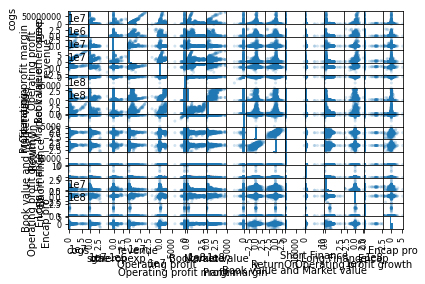

In [229]:
# Graficamos para poder revisar las correlaciones de las variables, vemos que es complicado de visualizar.
df = df.replace([np.inf, -np.inf], np.nan).dropna()
pd.plotting.scatter_matrix(df, alpha = 0.2)

In [232]:
# Graficamos un histograma de Market value para tener una mejor visualización de los datos
px.histogram(us2022_merged['Market value'], title = 'Market value')

In [233]:
df['Market value'].describe()

count    6.890900e+04
mean     3.992601e+06
std      1.799251e+07
min      0.000000e+00
25%      0.000000e+00
50%      5.964447e+04
75%      1.758610e+06
max      4.837475e+08
Name: Market value, dtype: float64

In [234]:
# Graficamos en scatter Market value, para tener una mejor visualización de los datos
px.scatter(df, x = 'ReturnOn', y = 'Market value', color = 'firm', title = 'Return contra Market value')

Podemos observar que Market value nos ayuda en la empresa a saber el valor en el mercado podemos decir es un retorno tentativo.

In [235]:
# Graficamos un histograma de Book value para tener una mejor visualización de los datos
px.histogram(us2022_merged['Book value'], title = 'Book value')

In [236]:
df['Book value'].describe()

count    6.890900e+04
mean     2.734082e+06
std      1.428057e+07
min     -5.438611e+06
25%      0.000000e+00
50%      7.456500e+04
75%      1.101097e+06
max      2.941270e+08
Name: Book value, dtype: float64

In [237]:
# Graficamos en scatter Book value, para tener una mejor visualización de los datos
px.scatter(df, x = 'ReturnOn', y = 'Book value', color = 'firm', title = 'Return contra Book value')

Igual mente en Book value podemos observar que nos ayuda en la empresa a saber el precio del libro y puede ser un mejor retorno que Market value.

In [238]:
# Graficamos un histograma de Operating profit para tener una mejor visualización de los datos
px.histogram(us2022_merged['Operating profit'], title = 'Operating profit')

In [239]:
df['Operating profit'].describe()

count    6.890900e+04
mean     1.275754e+05
std      8.113744e+05
min     -2.818500e+07
25%      0.000000e+00
50%      0.000000e+00
75%      4.283700e+04
max      1.512800e+07
Name: Operating profit, dtype: float64

In [223]:
# Graficamos en scatter Operating profit, para tener una mejor visualización de los datos
px.scatter(df, x = 'ReturnOn', y = 'Operating profit', color = 'firm', title = 'Return contra Operating profit')

* Design and run a multiple regression model to examine whether your selected factors and earnings per share deflated by price can explain/predict annual stock returns. You have to control for industry and firm size. To control for these variables you have to include them as extra independent variables in the model

In [240]:
# Realizamos nuestro modelo.
z = df[['Encap pro', 'Market value', 'Book value', 'Operating profit']]
x = sm.add_constant(z)
y = df['ReturnOn']

model = sm.OLS(y, x).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               ReturnOn   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.018
Method:                 Least Squares   F-statistic:                     311.7
Date:                Thu, 15 Sep 2022   Prob (F-statistic):          2.98e-266
Time:                        05:43:14   Log-Likelihood:                -3347.3
No. Observations:               68909   AIC:                             6705.
Df Residuals:                   68904   BIC:                             6750.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0354      0.001  

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



* Interpret your model

Viendo nuestros resultados del modelo nos percatamos que el unico que esta de forma positiva en nuestro modelo es Encap pro y Market value. 
Nos damos cuenta que nuesto coficiente en Encap pro 0.33, esto significa que nuestro retorno puede llegar a crecer un 0.33.

También podemos observar que ninguno de nuestras variables llega a tener un valor superior de 0.05 en P, de hecho solo Operating profit llega a tener un valor en P, cuando los demás todos llegan a ser 0. Esto nos quiere decir que en ninguna de las variables nos estamos equivocando en 5% de las veces realizadas. Esto gracias a poder explicativo bajo con el que cuenta el modelo.

Para Book value nuestro coeficiente llega a ser negativo, esto nos dice que los retornos serám menores, ya que se modifica más el modelo.

Pienso que el modelo tiene puntos de mejora para obtener mejores valores, ya que algunos resultados llegaron a ser negativos, aunque si llegamos a tener un buen estandar error al inicio.